# Homework Assignment 3

Using the [Seattle Library Collection Inventory Dataset](https://www.kaggle.com/city-of-seattle/seattle-library-collection-inventory#library-collection-inventory.csv) and TuriCreate please, answer the following questions:

Important Note: You can use a reltaviely small subset of the big dataset.

**Question 1:** Using Vaex, write a function that returns the most popular book in each subject. Use it to find the most popular book in
    the _Mystery Fiction_ subject (15pt)

In [1]:
!pip install kaggle
!pip install vaex 

import os
import re
import json
import vaex
import seaborn as sns
import plotly.express as px
from matplotlib import pyplot as plt


# Config kaggle
!mkdir /root/.kaggle/
api_token = {"username":"","key":""}
with open('/root/.kaggle/kaggle.json', 'w') as file:
  json.dump(api_token, file)
!chmod 600 /root/.kaggle/kaggle.json
# Download data
!kaggle datasets download -d city-of-seattle/seattle-library-collection-inventory
# Unzip data
!unzip seattle-library-collection-inventory.zip

def most_popular_book(df):
    # Remove null rows
    df = df.dropna()
    # Get subject list for subject string
    df["Subjects"] = df["Subjects"].apply(
        lambda x: [y.strip() for y in x.lower().split(",")])
    # Convert to pandas because vaex does not have explode function
    p_df = df.to_pandas_df()
    p_df = p_df.explode(["Subjects"])
    # Convert back to vaex dataframe
    v_df = vaex.from_pandas(p_df)
    # Groupby subjects and title and get the item count
    v_df_group = v_df.groupby(["Subjects", "Title"]).agg(
        {"ItemCount":"sum"}).sort(by="ItemCount", ascending=False)
    # Get unique subjects
    subjects = v_df_group["Subjects"].unique()
    # Define dict to store every subject most popular book
    most_popular_subject_book = {}
    # Loop over each subject
    for subject in subjects:
        # Get most popular book for subject 
        most_popular_subject_book[subject] = v_df_group[
            v_df_group["Subjects"] == subject][0][1]
    return most_popular_subject_book

# Read dataframe
df = vaex.read_csv("library-collection-inventory.csv", convert=True, 
                   progress=True, nrows=100000)
# Get most popular book in each subject
most_popular = most_popular_book(df)
# Get most popular book in the Mystery Fiction subject
print("The most popular book in the Mystery Fiction subject is: ", 
      most_popular["mystery fiction"])

Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/
Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 4.5/4.5 MB 40.1 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 58.2/58.2 KB 953.9 kB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 43.2/43.2 KB 2.6 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 1.2/1.2 MB 29.0 MB/s eta 0:00:00
  Preparing metadata (setup.py) ... done
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 11.7/11.7 MB 23.6 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 511.6/511.6 KB 20.7 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 1.6/1.6 MB 26.3 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 3.7/3.7 MB 41.2 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 1.2/1.2 MB 16.4 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━

/usr/local/lib/python3.9/dist-packages/vaex/expression.py:1629: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  result = np.array(result)
/usr/local/lib/python3.9/dist-packages/vaex/expression.py:1629: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  result = np.array(result)


The most popular book in the Mystery Fiction subject is:  Little green / Walter Mosley.


**Question 2**: Using Vaex, find the top-10 fiction subjects (5pt), and use Seaborn to visualize the number of items over time for each subject (15pt)
    

Top 10 fiction subjects:


#,Subjects,ItemCount
0,mystery fiction,1423
1,murder investigation fiction,618
2,detective and mystery fiction,517
3,historical fiction,424
4,suspense fiction,414
5,friendship fiction,317
6,thrillers fiction,217
7,friendship juvenile fiction,200
8,dogs fiction,183
9,cats juvenile fiction,138


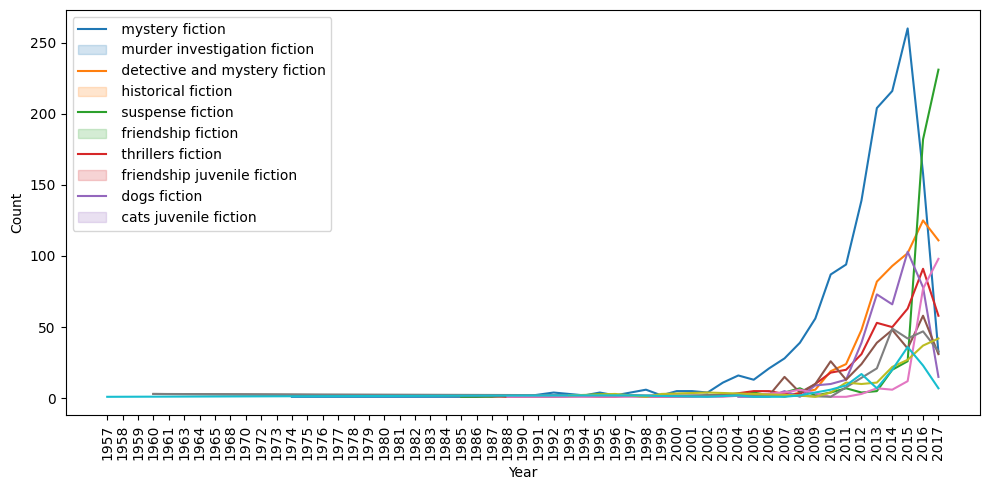

In [2]:
# Read dataframe
df = vaex.read_csv("library-collection-inventory.csv", convert=True, 
                   progress=True, nrows=100000)
# Remove null rows
df = df.dropna()
# Get year
r = re.compile('(\\d{4})')
def get_year(y_str, re_year):  
  if y_str is None or type(y_str) != str:
    return None
  l = re_year.findall(y_str) # take the first year
  if len(l) == 0 or l[0] is None or l[0] == "":
      return None
  return l[0]
df['Year'] = df["PublicationYear"].apply(lambda y: get_year(y, r) ) 
# Get subject list for subject string
df["Subjects"] = df["Subjects"].apply(
    lambda x: [y for y in x.lower().split(",")])
# Convert to pandas because vaex does not have explode function
p_df = df.to_pandas_df()
p_df = p_df.explode(["Subjects"])
# Convert back to vaex dataframe
v_df = vaex.from_pandas(p_df)
# filter non fiction subjects
v_df = v_df[v_df["Subjects"].apply(lambda x: 'fiction' in x)]
# Get top-10 fiction subjects
top_10 = v_df.groupby("Subjects").agg({"ItemCount":"sum"}).sort(
    by="ItemCount", ascending=False)[:10]
# Show top 10
print("Top 10 fiction subjects:")
display(top_10)
# Create years dataframe for order
years = v_df.Year
years = years.dropna()
years_df = vaex.from_arrays(Year=sorted(years.unique()))
# Loop over each top 10 subject
plt.figure(figsize=(10,5))
for index, top_k in top_10.iterrows():
    # Get number of items over time per year
    plot_df = v_df[v_df["Subjects"] == top_k["Subjects"]].groupby(
        "Year").agg({"ItemCount":"sum"}).sort(
            by="Year", ascending=True)
    # Join with years dataframe for order
    plot_df = years_df.join(plot_df, 
                        how='left', 
                        left_on ='Year',
                        right_on='Year').to_pandas_df()
    # Plot line plor
    sns.lineplot(plot_df, x="Year", y="ItemCount")
# Sort and show plot
plt.xticks(rotation=90)
plt.xlabel("Year")
plt.ylabel("Count")
plt.legend([top_k["Subjects"] for index, top_k in top_10.iterrows()])
plt.tight_layout()
plt.show()

**Question 3:** Using Vaex, write a function that gets as input a subject name. The function returns the top-20 most _popular_ authors for the input subject (15pt).



In [3]:
def top_most_popular_authors(df, subject, k):
    # Get subject list for subject string
    df["Subjects"] = df["Subjects"].apply(
        lambda x: [y for y in x.lower().split(",")])
    # Convert to pandas because vaex does not have explode function
    p_df = df.to_pandas_df()
    p_df = p_df.explode(["Subjects"])
    # Convert back to vaex dataframe
    v_df = vaex.from_pandas(p_df)
    # Get top k authors for subject
    return v_df[v_df["Subjects"] == subject].groupby(
        "Author").agg({"ItemCount":"sum"}).sort(
            by="ItemCount", ascending=False)[:k]

# Read dataframe
df = vaex.read_csv("library-collection-inventory.csv", convert=True, 
                   progress=True, nrows=100000)
# Remove null rows
df = df.dropna()

# Get top 20 authors for mystery fiction
top_most_popular_authors(df, "mystery fiction", 20)

#,Author,ItemCount
0,"McFetridge, John, 1959-",2
1,"Adler, David A.",2
2,"Weiss, Kirsten, 1968-",1
3,"Chandler, Raymond, 1888-1959",1
4,"McEvoy, John, 1936-",1
...,...,...
6,"Finlayson, Christine,",1
7,"Kiely, Tracy",1
8,"Monday, T. T., 1976-",1
9,"Wilson, Laura, 1964-",1


Using the [The Blog Authorship Corpus](https://www.kaggle.com/rtatman/blog-authorship-corpus.htm) and Vaex, please answer the following questions:

**Question 4:** Calculate the average and median age of bloggers in each topic by gender(5pt). 
Calculate the average and median age of bloggers according to their sign (5pt). 
Visualize the age distributions  of bloggers according to their  topic and gender using Seaborn and PlotlyExpress(15pt)

 96% 278M/290M [00:02<00:00, 177MB/s]
100% 290M/290M [00:02<00:00, 122MB/s]
Archive:  blog-authorship-corpus.zip
  inflating: blogtext.csv            
Converting csv to chunk files
Saved chunk #0 to blogtext.csv_chunk_0.hdf5
Average age of bloggers in each topic by gender
                             age       
                            mean median
topic          gender                  
Accounting     female  32.243570   26.0
               male    23.290909   23.0
Advertising    female  27.177740   23.0
               male    29.830091   26.0
Agriculture    female  24.548905   24.0
...                          ...    ...
Tourism        male    26.868966   25.0
Transportation female  31.702985   35.0
               male    31.298913   34.0
indUnk         female  24.964740   24.0
               male    24.483727   24.0

[80 rows x 2 columns]

Average age of bloggers by sign
                   age       
                  mean median
sign                         
Aquarius     23.53718

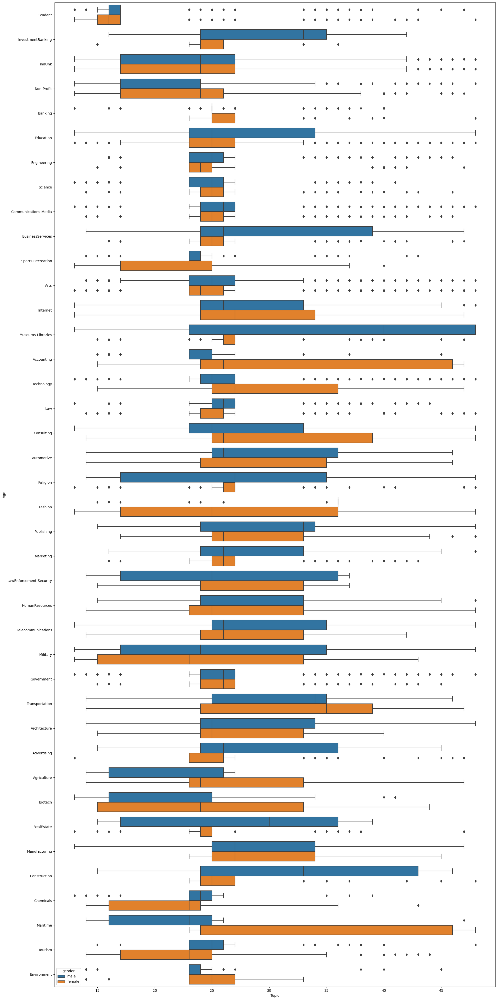


age distributions of bloggers according to their topic and gender using plotly express


In [4]:
# Download data
!kaggle datasets download -d rtatman/blog-authorship-corpus
# Unzip data
!unzip blog-authorship-corpus.zip
# Read dataframe
df = vaex.read_csv("blogtext.csv", convert=True, progress=True)
# Calculate age median and average per topic and gender
# We convert to pandas becuase vaex does not support median
print("Average age of bloggers in each topic by gender")
print(df.to_pandas_df().groupby(["topic", "gender"]).agg({"age": ["mean", "median"]}))
# Calculate age median and average per sign
# We convert to pandas becuase vaex does not support median
print()
print("Average age of bloggers by sign")
print(df.to_pandas_df().groupby(["sign"]).agg({"age": ["mean", "median"]}))
# Visualize the age distributions of bloggers according to their topic and 
# gender using Seaborn
print()
print("age distributions of bloggers according to their topic and gender using Seaborn")
fig, ax = plt.subplots(figsize=(20,40))
ax = sns.boxplot(df.to_pandas_df(), x="age", y="topic", hue="gender", ax=ax)
plt.xlabel("Topic")
plt.ylabel("Age")
plt.tight_layout()
plt.show()
print()
print("age distributions of bloggers according to their topic and gender using plotly express")
# Visualize the age distributions of bloggers according to their topic and 
# gender using plotly express
fig = px.box(df.to_pandas_df(), x="age", y="topic", color="gender", width=800, height=2000)
fig.show()

**Question 5:** Using the  [SJR Journal Ranking of 2018](https://www.scimagojr.com/journalrank.php) dataset and Seaborn, visualize
    the H-index distributions according to the SJR Best Quartile (15pt). Using a grid, visualize the _Cites / Doc. (2years)_ histograms values of each publisher (15pt).
    


--2023-04-08 16:19:17--  https://www.scimagojr.com/journalrank.php?out=xls
Resolving www.scimagojr.com (www.scimagojr.com)... 94.130.25.5
Connecting to www.scimagojr.com (www.scimagojr.com)|94.130.25.5|:443... connected.
HTTP request sent, awaiting response... 200 OK
Length: unspecified [text/csv]
Saving to: ‘sjr.csv’

sjr.csv                 [    <=>             ]   7.76M  8.50MB/s    in 0.9s    

2023-04-08 16:19:20 (8.50 MB/s) - ‘sjr.csv’ saved [8136257]


H-index distributions according to the SJR Best Quartile


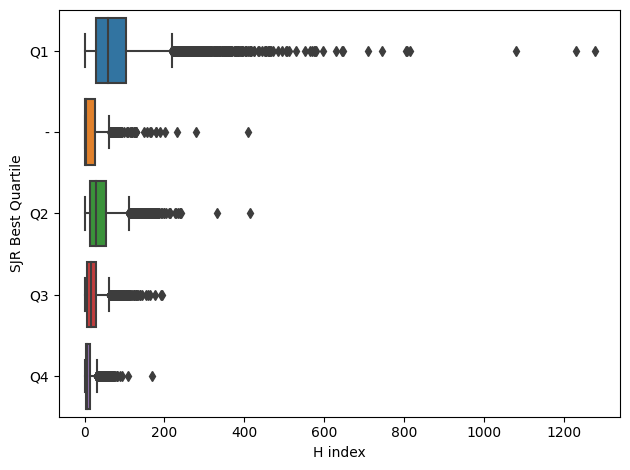


Cites / Doc. (2years) histograms values of top 15 publishers


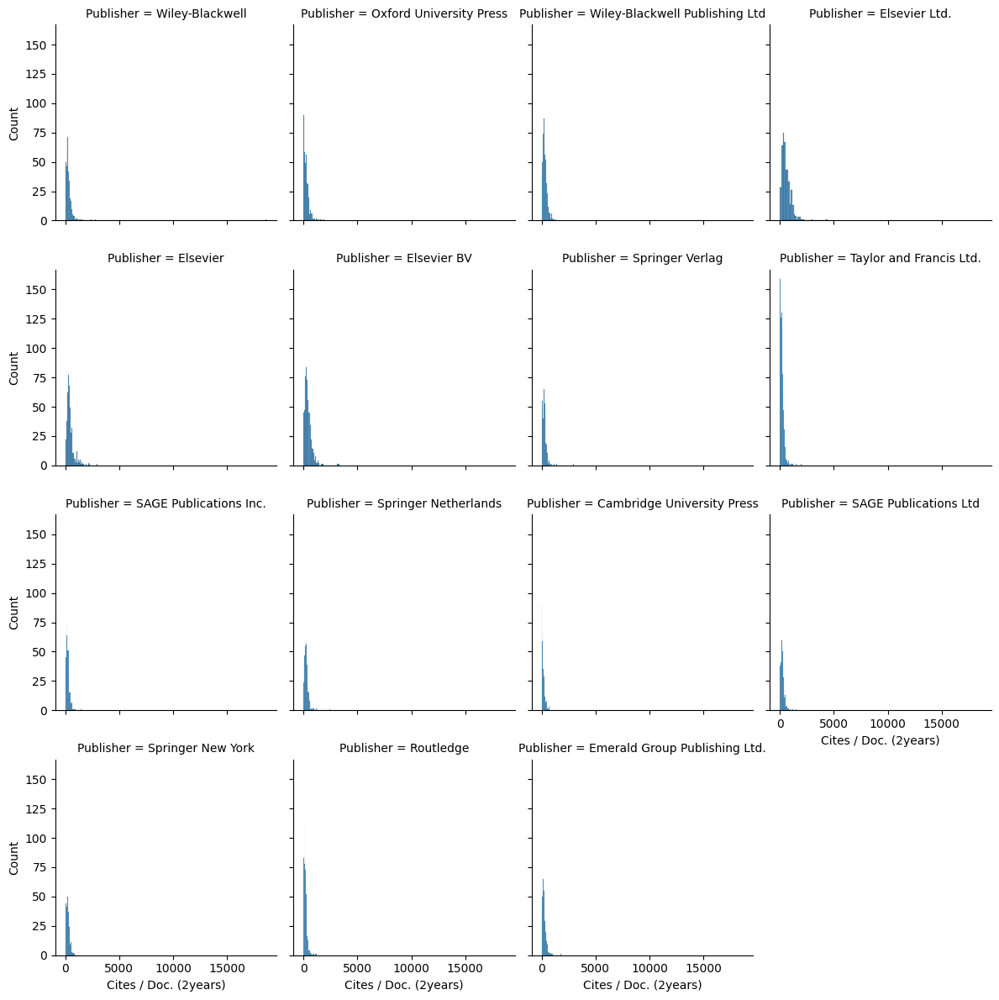

In [5]:
# Download data
!wget -O sjr.csv https://www.scimagojr.com/journalrank.php?out=xls 
# Read dataframe
df = vaex.read_csv("sjr.csv", delimiter=";")
""" Visualize the H-index distributions according to the SJR Best Quartile"""
print()
print("H-index distributions according to the SJR Best Quartile")
sns.boxplot(df.to_pandas_df(), x="H index", y="SJR Best Quartile")
plt.tight_layout()
plt.show()

""" Visualize the Cites / Doc. (2years) histograms values of each publisher"""
# Get top 15 most common publishers becase ther are to many publisher to plot
publishers = list(df["Publisher"].value_counts(
    ascending=False, dropna=True)[:15].index)
# Filter to include only 15 most common publishers
df_sub = df[df.Publisher.isin(publishers)]
# Make column float
df_sub["Cites / Doc. (2years)"] = df_sub["Cites / Doc. (2years)"].apply(
    lambda x: float(x.replace(",","")))
# Visualize 
print()
print("Cites / Doc. (2years) histograms values of top 15 publishers")
g = sns.FacetGrid(df_sub.to_pandas_df(), col="Publisher", col_wrap=4, 
                  height=3, margin_titles=False)
g.map(sns.histplot, "Cites / Doc. (2years)")
plt.tight_layout()
plt.show()